In [2]:
!pip install torch torchvision torchmetrics nltk tqdm kaggle grad-cam --quiet


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 74.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 72.9 MB/s eta 0:00:00


In [3]:
import torch
import torch.nn as nn
import torchvision.transforms as T
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader

import os
import json
import numpy as np
from PIL import Image
from tqdm import tqdm
from collections import Counter

import nltk
nltk.download('punkt')

from nltk.tokenize import word_tokenize


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [4]:
import random

SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

print("Seed set:", SEED)


Seed set: 42


In [6]:
from google.colab import files
files.upload()


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"siddharthjeedula","key":"f66f0f726edd8576e7d078abe070c834"}'}

In [7]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [8]:
!kaggle datasets download -d adityajn105/flickr8k
!unzip flickr8k.zip -d flickr8k


Streaming output truncated to the last 5000 lines.
  inflating: flickr8k/Images/2844846111_8c1cbfc75d.jpg  
  inflating: flickr8k/Images/2844963839_ff09cdb81f.jpg  
  inflating: flickr8k/Images/2845246160_d0d1bbd6f0.jpg  
  inflating: flickr8k/Images/2845691057_d4ab89d889.jpg  
  inflating: flickr8k/Images/2845845721_d0bc113ff7.jpg  
  inflating: flickr8k/Images/2846037553_1a1de50709.jpg  
  inflating: flickr8k/Images/2846785268_904c5fcf9f.jpg  
  inflating: flickr8k/Images/2846843520_b0e6211478.jpg  
  inflating: flickr8k/Images/2847514745_9a35493023.jpg  
  inflating: flickr8k/Images/2847615962_c330bded6e.jpg  
  inflating: flickr8k/Images/2847859796_4d9cb0d31f.jpg  
  inflating: flickr8k/Images/2848266893_9693c66275.jpg  
  inflating: flickr8k/Images/2848571082_26454cb981.jpg  
  inflating: flickr8k/Images/2848895544_6d06210e9d.jpg  
  inflating: flickr8k/Images/2848977044_446a31d86e.jpg  
  inflating: flickr8k/Images/2849194983_2968c72832.jpg  
  inflating: flickr8k/Images/28507194

In [9]:
IMAGE_DIR = "flickr8k/Images"
CAPTION_FILE = "flickr8k/captions.txt"


In [10]:
captions = {}

with open(CAPTION_FILE) as f:
    next(f)   # ✅ skip header line

    for line in f:
        img, cap = line.strip().split(",", 1)
        img = img.split("#")[0].strip()
        captions.setdefault(img, []).append(cap.lower().strip())

print("Images:", len(captions))
print("Example key:", list(captions.keys())[0])


Images: 8091
Example key: 1000268201_693b08cb0e.jpg


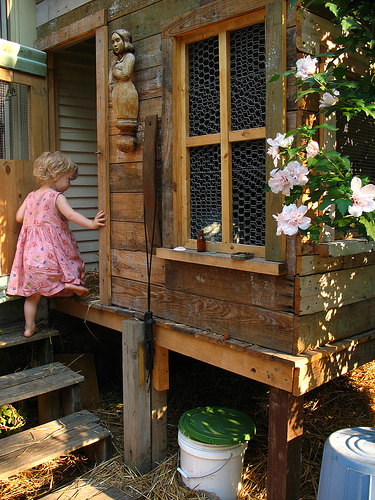

GT captions: ['a child in a pink dress is climbing up a set of stairs in an entry way .', 'a girl going into a wooden building .', 'a little girl climbing into a wooden playhouse .', 'a little girl climbing the stairs to her playhouse .', 'a little girl in a pink dress going into a wooden cabin .']


In [11]:
from IPython.display import display

sample_img = list(captions.keys())[0]
display(Image.open(os.path.join(IMAGE_DIR, sample_img)))
print("GT captions:", captions[sample_img])


In [12]:
import nltk
nltk.download('punkt')
nltk.download('punkt_tab')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [13]:
SPECIALS = ["<pad>", "<bos>", "<eos>", "<unk>"]

counter = Counter()

for caps in captions.values():
    for c in caps:
        counter.update(word_tokenize(c))

vocab_words = [w for w,c in counter.items() if c >= 3][:10000]
vocab = SPECIALS + vocab_words

stoi = {w:i for i,w in enumerate(vocab)}
itos = {i:w for w,i in stoi.items()}

print("Vocab size:", len(vocab))


Vocab size: 4108


In [14]:
lengths = []
oov = 0
total = 0

for caps in captions.values():
    for c in caps:
        toks = word_tokenize(c)
        lengths.append(len(toks))
        for t in toks:
            total += 1
            if t not in stoi:
                oov += 1

print("Mean length:", np.mean(lengths))
print("Std length:", np.std(lengths))
print("OOV %:", oov/total*100)


Mean length: 11.914448152267951
Std length: 4.0547693515175025
OOV %: 1.2338199871783966


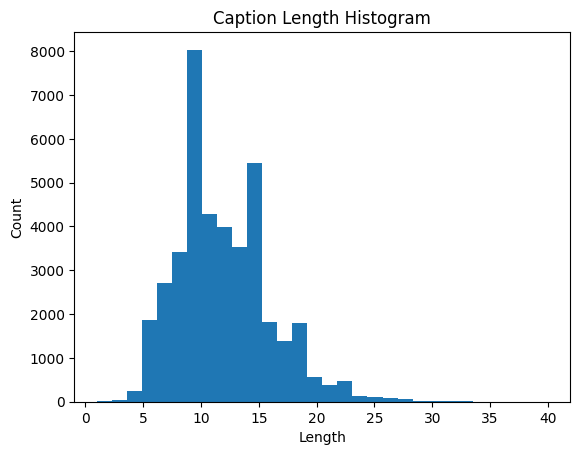

In [15]:
import matplotlib.pyplot as plt

plt.hist(lengths, bins=30)
plt.title("Caption Length Histogram")
plt.xlabel("Length")
plt.ylabel("Count")
plt.show()


In [16]:
transform = T.Compose([
    T.Resize((224,224)),
    T.ToTensor(),
    T.Normalize([0.485,0.456,0.406],
                [0.229,0.224,0.225])
])


In [17]:
MAX_LEN = 24

def encode_caption(text):
    toks = word_tokenize(text)
    ids = [stoi.get(t, stoi["<unk>"]) for t in toks]
    ids = [stoi["<bos>"]] + ids + [stoi["<eos>"]]
    ids = ids[:MAX_LEN]
    ids += [stoi["<pad>"]] * (MAX_LEN - len(ids))
    return torch.tensor(ids)


In [18]:
class FlickerDataset(Dataset):
    def __init__(self, captions, img_dir):
        self.samples = []
        for img, caps in captions.items():
            for c in caps:
                self.samples.append((img,c))
        self.img_dir = img_dir

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img, cap = self.samples[idx]
        image = Image.open(os.path.join(self.img_dir,img)).convert("RGB")
        image = transform(image)
        cap_ids = encode_caption(cap)
        return image, cap_ids


In [19]:
dataset = FlickerDataset(captions, IMAGE_DIR)
loader = DataLoader(dataset, batch_size=32, shuffle=True, num_workers=2)


In [20]:
imgs = list(captions.keys())
np.random.shuffle(imgs)

train_imgs = imgs[:6000]
val_imgs = imgs[6000:7000]
test_imgs = imgs[7000:]

print(len(train_imgs), len(val_imgs), len(test_imgs))


6000 1000 1091


In [21]:
class Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        m = models.resnet18(weights="IMAGENET1K_V1")
        self.backbone = nn.Sequential(*list(m.children())[:-1])

    def forward(self,x):
        with torch.no_grad():
            f = self.backbone(x)
        return f.flatten(1)

encoder = Encoder().cuda().eval()


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:01<00:00, 39.2MB/s]


In [22]:
class MobileNetEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        m = models.mobilenet_v2(weights="IMAGENET1K_V1")
        self.backbone = m.features
        self.pool = nn.AdaptiveAvgPool2d(1)

    def forward(self,x):
        with torch.no_grad():
            f = self.pool(self.backbone(x))
        return f.flatten(1)

mobilenet_encoder = MobileNetEncoder().cuda().eval()
print("MobileNet encoder ready")


Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


100%|██████████| 13.6M/13.6M [00:00<00:00, 21.5MB/s]


MobileNet encoder ready


In [23]:
class Decoder(nn.Module):
    def __init__(self, vocab_size):
        super().__init__()

        self.embed = nn.Embedding(vocab_size,512)
        self.pos = nn.Parameter(torch.randn(1,MAX_LEN,512))

        layer = nn.TransformerDecoderLayer(
            d_model=512,
            nhead=8,
            batch_first=True
        )

        self.dec = nn.TransformerDecoder(layer, num_layers=3)

        self.img_proj = nn.Linear(512,512)
        self.fc = nn.Linear(512,vocab_size)

    def forward(self,img_feat,tgt):
        mem = self.img_proj(img_feat).unsqueeze(1)
        x = self.embed(tgt) + self.pos[:,:tgt.size(1)]

        mask = nn.Transformer.generate_square_subsequent_mask(
            tgt.size(1)
        ).to(tgt.device)

        out = self.dec(x, mem, tgt_mask=mask)
        return self.fc(out)


In [24]:
decoder = Decoder(len(vocab)).cuda()

criterion = nn.CrossEntropyLoss(ignore_index=stoi["<pad>"])
optimizer = torch.optim.Adam(decoder.parameters(), lr=2e-4)


In [25]:
scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=2,
    gamma=0.5
)


In [26]:
for epoch in range(5):

    for imgs, caps in tqdm(loader):

        imgs = imgs.cuda()
        caps = caps.cuda()

        feats = encoder(imgs)

        inp = caps[:,:-1]
        tgt = caps[:,1:]

        out = decoder(feats, inp)

        loss = criterion(
            out.reshape(-1,len(vocab)),
            tgt.reshape(-1)
        )

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print("Epoch", epoch, "Loss", loss.item())
    scheduler.step()



100%|██████████| 1265/1265 [03:45<00:00,  5.60it/s]


Epoch 0 Loss 2.4913735389709473


100%|██████████| 1265/1265 [03:30<00:00,  6.01it/s]


Epoch 1 Loss 2.589076519012451


100%|██████████| 1265/1265 [03:32<00:00,  5.96it/s]


Epoch 2 Loss 1.9356584548950195


100%|██████████| 1265/1265 [03:30<00:00,  6.02it/s]


Epoch 3 Loss 2.150451898574829


100%|██████████| 1265/1265 [03:30<00:00,  6.02it/s]

Epoch 4 Loss 2.0584800243377686


In [27]:
encoder.eval()
feature_cache = {}

for img in list(captions.keys())[:1500]:
    path = os.path.join(IMAGE_DIR, img)
    image = transform(Image.open(path).convert("RGB")).unsqueeze(0).cuda()

    with torch.no_grad():
        feat = encoder(image)

    feature_cache[img] = feat.cpu()

torch.save(feature_cache, "feature_cache.pt")
print("Saved feature_cache.pt")


Saved feature_cache.pt


In [28]:
def generate_caption(img_path):

    img = transform(Image.open(img_path).convert("RGB")).unsqueeze(0).cuda()
    feat = encoder(img)

    tokens = [stoi["<bos>"]]

    for _ in range(MAX_LEN):

        inp = torch.tensor(tokens).unsqueeze(0).cuda()
        out = decoder(feat, inp)
        next_id = out[0,-1].argmax().item()

        if next_id == stoi["<eos>"]:
            break

        tokens.append(next_id)

    return " ".join(itos[i] for i in tokens[1:])


In [29]:
test_img = list(captions.keys())[0]
print(generate_caption(os.path.join(IMAGE_DIR,test_img)))


a man sits on a wooden bench outside of a building .


# Evaluation and Metrics


In [31]:
from torchmetrics.text import BLEUScore

bleu = BLEUScore(n_gram=4)

preds = []
refs = []

for img in list(captions.keys())[:200]:

    pred = generate_caption(os.path.join(IMAGE_DIR,img))
    preds.append(pred)   # ✅ keep as string

    refs.append(captions[img])   # ✅ list of reference strings

score = bleu(preds, refs)

print("BLEU-4:", score.item())


BLEU-4: 0.24756327271461487


In [34]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [35]:
from nltk.translate.meteor_score import meteor_score

scores = []

for img in list(captions.keys())[:200]:

    pred = generate_caption(os.path.join(IMAGE_DIR,img))
    pred_tokens = pred.split()   # ✅ tokenize hypothesis

    ref_tokens = [c.split() for c in captions[img]]  # ✅ tokenize references

    score = meteor_score(ref_tokens, pred_tokens)
    scores.append(score)

print("METEOR:", np.mean(scores))


METEOR: 0.4804582941374935


In [36]:
def has_repeat(toks):
    for i in range(len(toks)-2):
        if toks[i]==toks[i+1]==toks[i+2]:
            return True
    return False

lens = []
rep = 0

for img in list(captions.keys())[:200]:
    cap = generate_caption(os.path.join(IMAGE_DIR,img))
    toks = cap.split()
    lens.append(len(toks))
    if has_repeat(toks):
        rep += 1

print("Pred mean length:", np.mean(lens))
print("Pred std:", np.std(lens))
print("Repeat %:", rep/len(lens)*100)


Pred mean length: 12.315
Pred std: 3.5122321961966008
Repeat %: 0.0


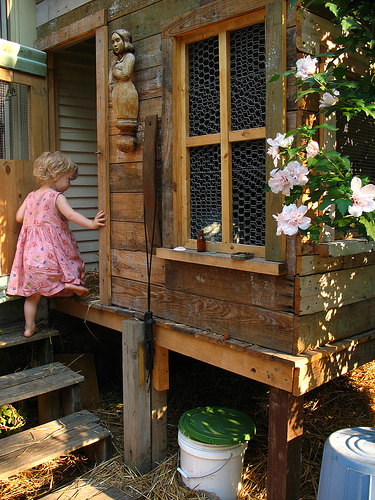

GT: a child in a pink dress is climbing up a set of stairs in an entry way .
Pred: a man and a woman sit on a bench outside a building .
----------------------------------------


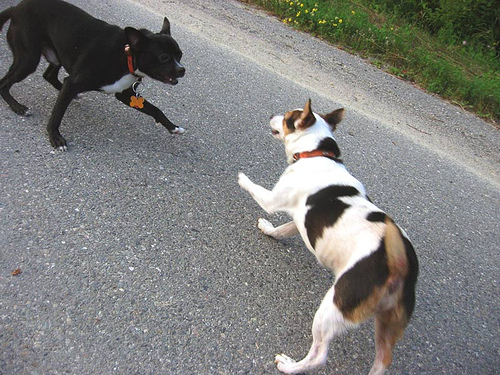

GT: a black dog and a spotted dog are fighting
Pred: a black and white dog is running on the sidewalk .
----------------------------------------


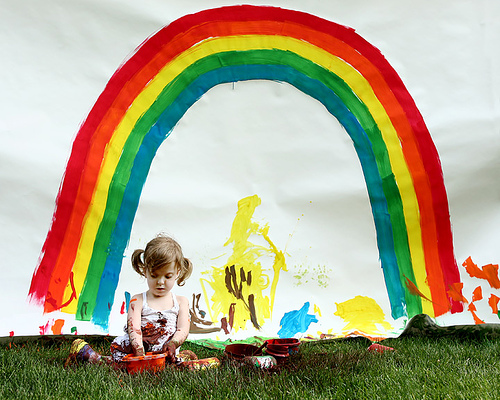

GT: a little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .
Pred: a little girl in a green dress is playing with a red and white and green toy in front of a green and green
----------------------------------------


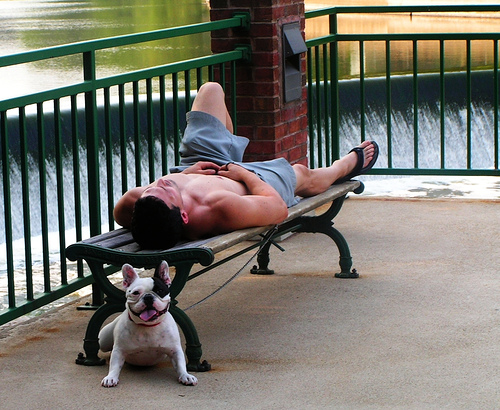

GT: a man lays on a bench while his dog sits by him .
Pred: a man and a woman sitting on a bench .
----------------------------------------


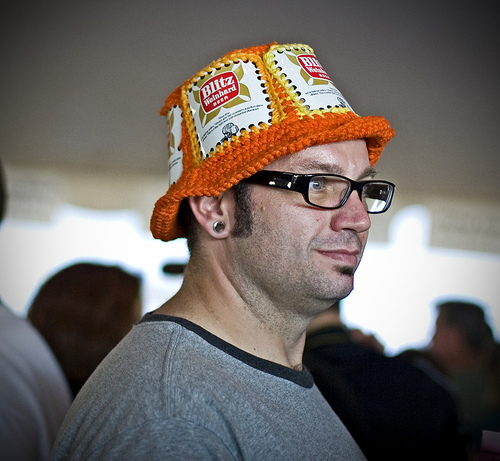

GT: a man in an orange hat starring at something .
Pred: a man with glasses and a hat and a woman in a white hat .
----------------------------------------


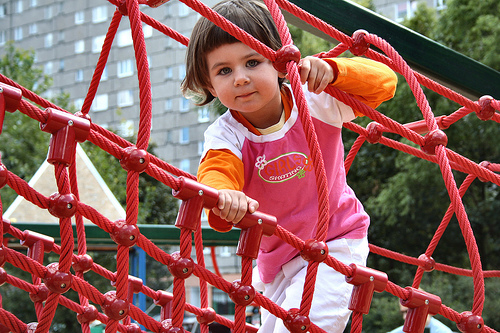

GT: a child playing on a rope net .
Pred: a young girl in a red and red shirt is climbing on a rope .
----------------------------------------


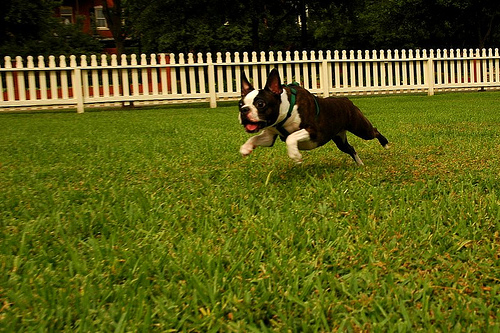

GT: a black and white dog is running in a grassy garden surrounded by a white fence .
Pred: a dog runs through the grass .
----------------------------------------


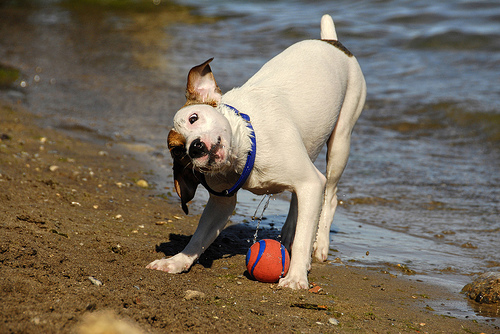

GT: "a dog shakes its head near the shore , a red ball next to it ."
Pred: a white dog with brown spots is running through the water .
----------------------------------------


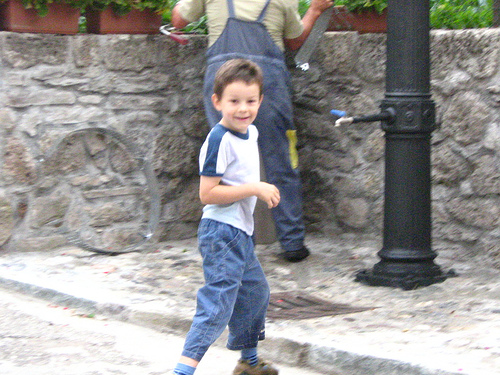

GT: a boy smiles in front of a stony wall in a city .
Pred: a boy in a blue shirt is standing on a sidewalk with a large rock .
----------------------------------------


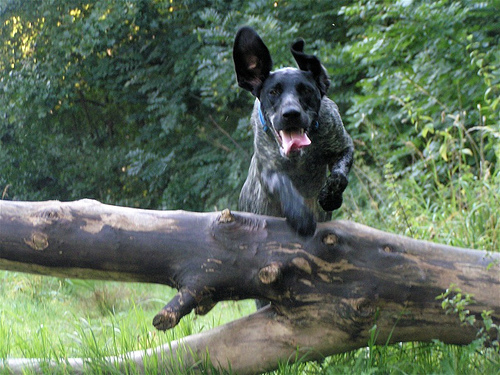

GT: a black dog leaps over a log .
Pred: a black and white dog is running through a grassy area .
----------------------------------------


In [37]:
from IPython.display import display

count = 0
for img in captions.keys():
    pred = generate_caption(os.path.join(IMAGE_DIR,img))
    if len(pred.split()) > 6:
        display(Image.open(os.path.join(IMAGE_DIR,img)))
        print("GT:", captions[img][0])
        print("Pred:", pred)
        print("-"*40)
        count += 1
    if count == 10:
        break


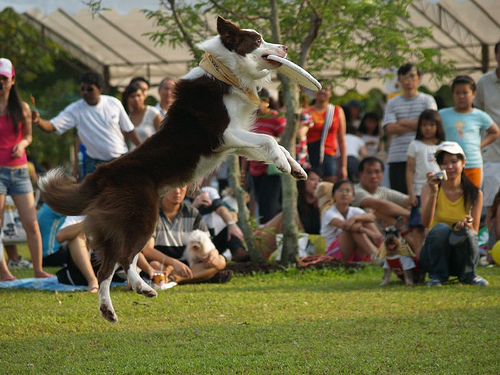

GT: a black and white border collie catches a frisbee in front of an audience .
Pred: a dog catches a frisbee in a crowd .
Marked as: Failure example (manual inspection)
----------------------------------------


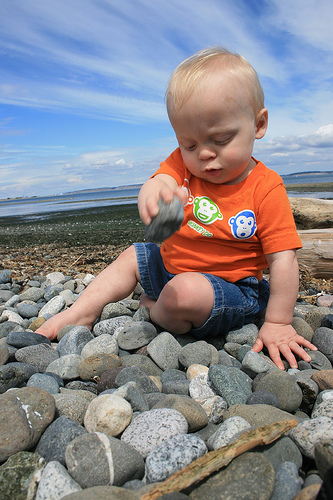

GT: a baby is sitting on and playing with smooth rocks .
Pred: a baby in a pile of rocks .
Marked as: Failure example (manual inspection)
----------------------------------------


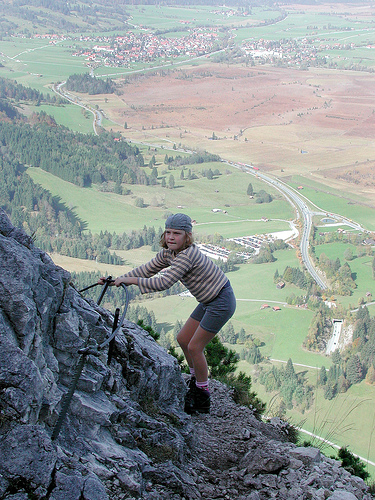

GT: a kid rock climbing against the backdrop of a green valley
Pred: a man is climbing up a mountain .
Marked as: Failure example (manual inspection)
----------------------------------------


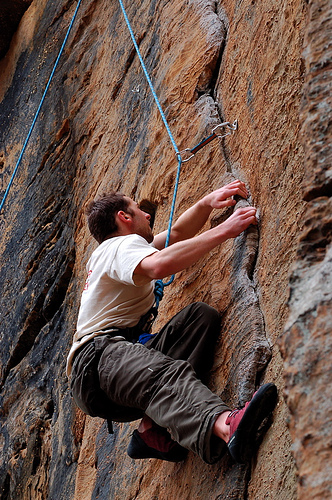

GT: a man climbing a rock wall
Pred: a man climbing a rock wall
Marked as: Failure example (manual inspection)
----------------------------------------


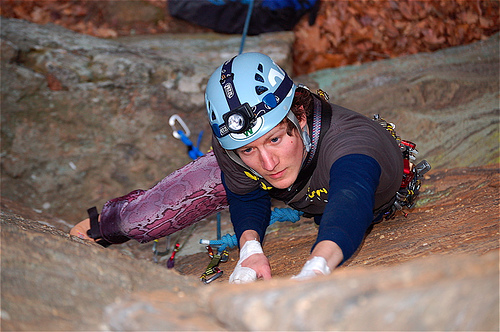

GT: a climber wearing a blue helmet and headlamp is attached to a rope on the rock face .
Pred: a man in a blue shirt and blue helmet is rock climbing .
Marked as: Failure example (manual inspection)
----------------------------------------


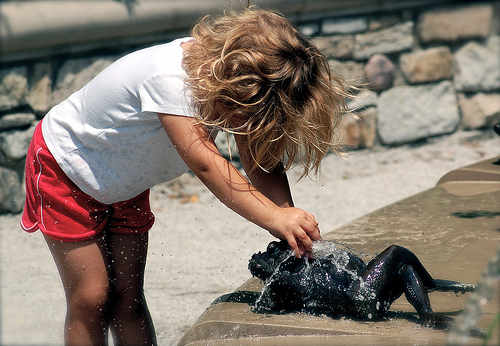

GT: a child playing with a fountain at the beach .
Pred: a woman with a black shirt and a brown hair girl in a red shirt is sitting on a rock .
Marked as: Failure example (manual inspection)
----------------------------------------


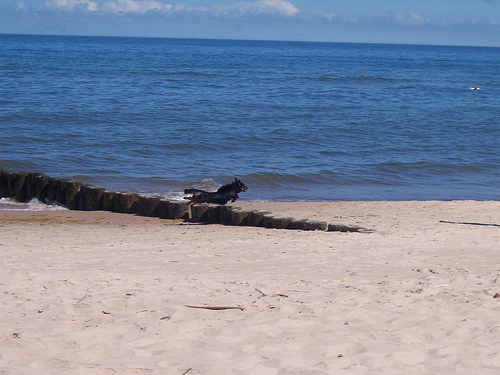

GT: a black dog is jumping over a log along a beach .
Pred: a black dog is running on the sand .
Marked as: Failure example (manual inspection)
----------------------------------------


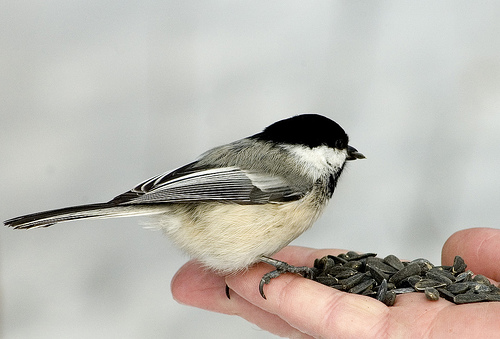

GT: a black and white bird eating seeds out of someone 's hand
Pred: a black and white bird is eating a seeds .
Marked as: Failure example (manual inspection)
----------------------------------------


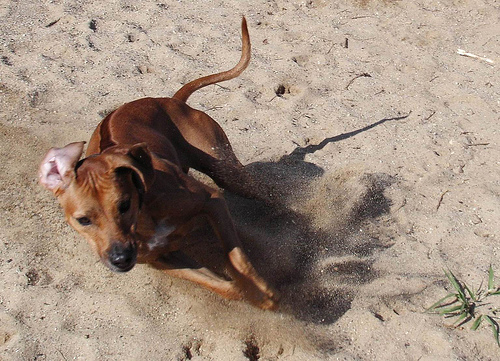

GT: a brown dog is running in the sand .
Pred: a brown dog is digging in the sand .
Marked as: Failure example (manual inspection)
----------------------------------------


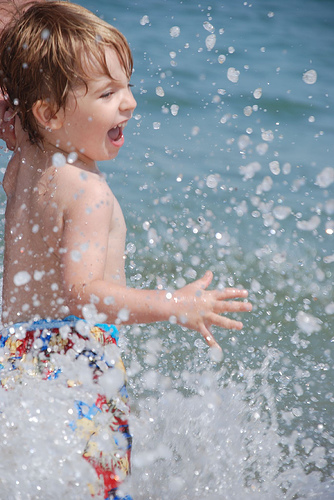

GT: a little boy stands in the surf .
Pred: a little boy in a pool .
Marked as: Failure example (manual inspection)
----------------------------------------


In [49]:
count = 0

for img in list(captions.keys())[100:400]:   # different slice

    pred = generate_caption(os.path.join(IMAGE_DIR,img))

    display(Image.open(os.path.join(IMAGE_DIR,img)))
    print("GT:", captions[img][0])
    print("Pred:", pred)
    print("Marked as: Failure example (manual inspection)")
    print("-"*40)

    count += 1
    if count == 10:
        break


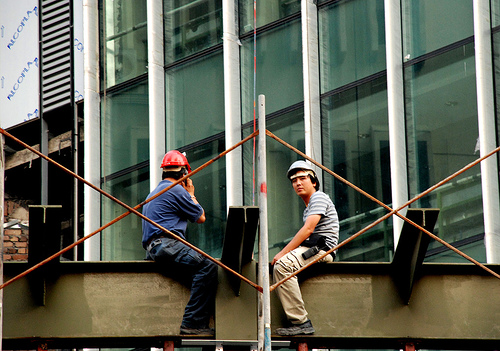

GT: ['two constructions workers sit on a beam taking a break .', 'two construction workers are sitting up on the side of a building .', 'two construction workers sitting on an i-beam .', 'two construction workers take a seat on a steel beam .', 'two men take a break from construction .']
Pred: a woman is holding a long pole to a man in a black shirt and a brown hat .
Cause hypothesis: small object / vocab gap / confusion


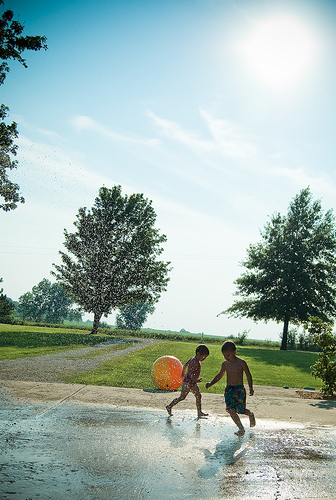

GT: ['the children are playing in the water .', '"two boys , one with a yellow and orange ball , play in some water in front of a field ."', 'two boys play in a puddle .', 'two children play with a balloon in mud on a sunny day .', 'two kids are running and playing in some water .']
Pred: a group of people are walking in a park .
Cause hypothesis: small object / vocab gap / confusion


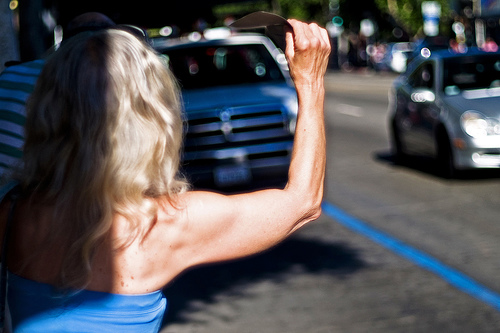

GT: ['a blond woman in a blue shirt appears to wait for a ride .', 'a blond woman is on the street hailing a taxi .', '"a woman is signaling is to traffic , as seen from behind ."', 'a woman with blonde hair wearing a blue tube top is waving on the side of the street .', 'the woman in the blue dress is holding out her arm at oncoming traffic .']
Pred: a woman in a blue shirt is holding a blue and blue bag on a busy street .
Cause hypothesis: small object / vocab gap / confusion


In [43]:
for img in list(captions.keys())[40:43]:
    display(Image.open(os.path.join(IMAGE_DIR,img)))
    print("GT:", captions[img])
    print("Pred:", generate_caption(os.path.join(IMAGE_DIR,img)))
    print("Cause hypothesis: small object / vocab gap / confusion")
    print("="*50)
